In [8]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
import math
import seaborn as sns
import os
# %config IPCompleter.greedy=True
%load_ext autoreload
%autoreload 2

sc.settings.verbosity = 0
sc.logging.print_header()
sns.set_context("paper")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
scanpy==1.6.0 anndata==0.7.4 umap==0.4.3 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.10.1 python-igraph==0.8.0 louvain==0.6.1 leidenalg==0.8.0


In [9]:
import warnings
warnings.simplefilter( action="ignore", category=FutureWarning)

In [10]:
# import local module containing misc code, helps keep notebooks clean from commonly used functions
import sys
sys.path.insert(0, '../')
import new_misc_code as nmc 

In [11]:
# set paths to directories for data and figures
fig_path = "/dd_userdata/usrdat03/userdata/cherring/data/cellranger_outputs/brain_maturation_RNA/out_figs/"

In [12]:
# read in downsampled count matrices post whole-tissue clustering
wt_adata = sc.read( "../data/post-wt-clustering.h5ad")
wt_adata

AnnData object with n_obs × n_vars = 154748 × 26747
    obs: 'batch', 'RL#', 'age', 'chem', 'concat_id', 'numerical_age', 'stage_id', 'Sex', 'Race', 'PMI', 'Brain Regions*', 'Cause of Death', 'ICD-10 Code', 'ICD-10 category', 'Oxygen/No Oxygen', 'Date-of-Collection', 'Collection_year', 'Library Prep Date', 'Library Prep Lot', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublet_score', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden', 'mat/dev', 'cell_type', 'major_clust', 'sub_clust', 'dev_clust', 'downstream_dev_clusts'
    var: 'gene_ids', 'feature_types', 'non-unique_names', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'age_order', 'batch_colors', 'batch_colors_dict', 'batch_order', 'cell_type_colors', 'hvg', 'major_clust_colors',

In [13]:
# set CPM downsampled counts to anndata X
wt_adata.X = wt_adata.layers['ds_norm_cts'].copy()

### Select for Inhibitory Neurons

In [14]:
adata = wt_adata[wt_adata.obs['cell_type'].isin(['IN'])]
adata.shape

(27561, 26747)

In [15]:
# remove low count genes
sc.pp.filter_genes( adata, min_cells=5)
adata.shape

Trying to set attribute `.var` of view, copying.


(27561, 22583)

Nuclei count per batch

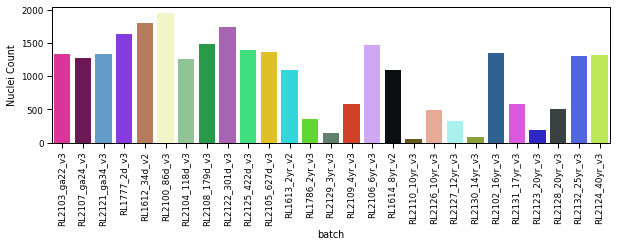

In [16]:
plt.figure( figsize=(10,2.5))
plt.xticks(rotation=90) 
sns.countplot( adata.obs['batch'], order=adata.uns['batch_order'], palette=adata.uns['batch_colors_dict'], );
plt.ylabel( "Nuclei Count");
plt.savefig( f"{fig_path}whole-tissue_post-ds_nuc-cts_per-batch.svg", format='svg', bbox_inches='tight')

Nuclei count per stage_id

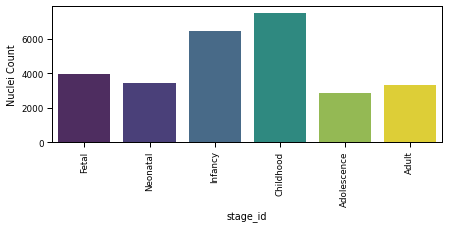

In [17]:
plt.figure( figsize=(7,2.5))
plt.xticks(rotation=90) 
sns.countplot( adata.obs['stage_id'], order=adata.uns['stage_order'], palette=adata.uns['stage_colors_dict'], );
plt.ylabel( "Nuclei Count");
plt.savefig( f"{fig_path}whole-tissue_post-ds_nuc-cts_per-stage.svg", format='svg', bbox_inches='tight')

### Feature Selection - select 4,000 highly variable genes

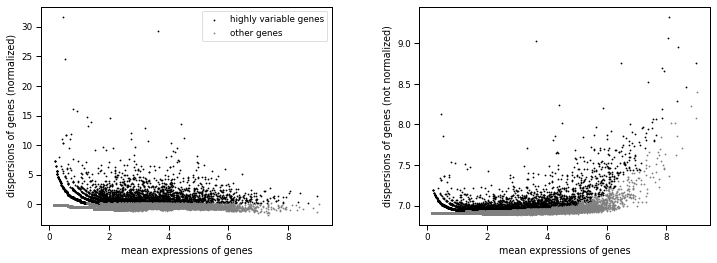

In [18]:
n_hvg = 4_000
sc.pp.highly_variable_genes( adata, n_top_genes=n_hvg, n_bins=20, flavor='seurat', inplace=True)
sc.pl.highly_variable_genes( adata)

In [19]:
high_adata = adata[:,adata.var.highly_variable.values]
high_adata.shape

(27561, 4000)

## **PCA**

In [20]:
n_comps = 350
sc.pp.pca( high_adata, n_comps=n_comps) #, use_highly_variable=True)

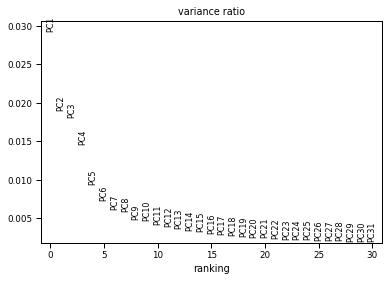

In [21]:
sc.pl.pca_variance_ratio( high_adata)

Find number of components needed to explain 50% of variation in data

In [22]:
n_pcs = ( np.cumsum( high_adata.uns['pca']['variance_ratio'])<0.50).sum()
if( n_pcs==n_comps):
    n_pcs = None
    print( "re-run PCA with more components")
n_pcs

303

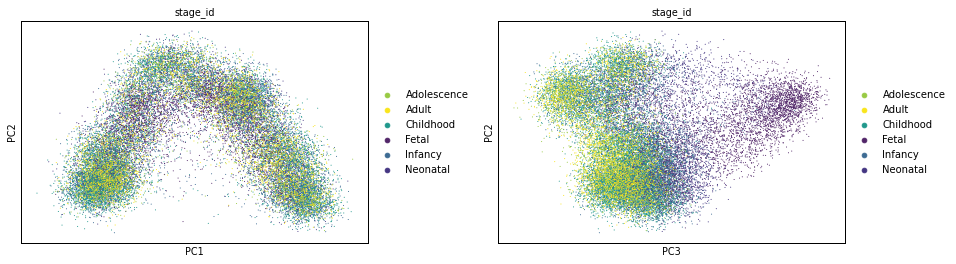

In [23]:
sc.pl.pca( high_adata, color=['stage_id'], components=['1,2','3,2'], legend_fontsize=10, wspace=0.25)

## **UMAP**

In [24]:
# set number of cores to use
sc.settings.n_jobs = 25
# find nearest neighbors
sc.pp.neighbors( high_adata, n_neighbors=25, n_pcs=n_pcs, random_state=2)
# calc umap
sc.tl.umap( high_adata, random_state=2)

## **Leiden Clusting**
This is clustering for all nuclei, but inhibitory neurons separately are re-clustered at a higher resolution in the inhibitory_clustering.ipynb notebook. 

In [25]:
sc.tl.leiden( high_adata, resolution=5.0, random_state=0)
sc.tl.rank_genes_groups( high_adata, 'leiden')

## **Misc Feature Plots**

Since scanpy doesn't currently have an option to fully randomize order of observations for plotting, create a randomly ordered adata for plotting. Setting *sort_order=False* will still plot observations in order of indices, i.e. order batches were concated. 

In [26]:
# subsampling the full adata will reproduce adata with random order
plt_adata = sc.pp.subsample( high_adata, fraction=1.0, random_state=0, copy=True)

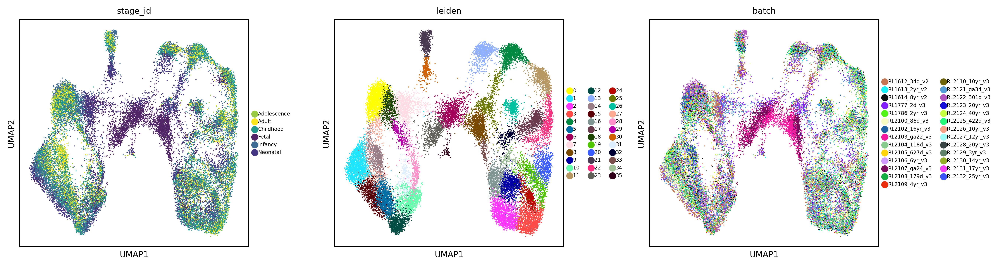

In [27]:
sc.settings.set_figure_params( dpi=200, fontsize=8)
sc.pl.umap( plt_adata, color=['stage_id','leiden','batch'], legend_fontsize=5, wspace=0.25)
# sc.pl.umap( plt_adata, color=['stage_id','batch'], legend_fontsize=5, wspace=0.25)

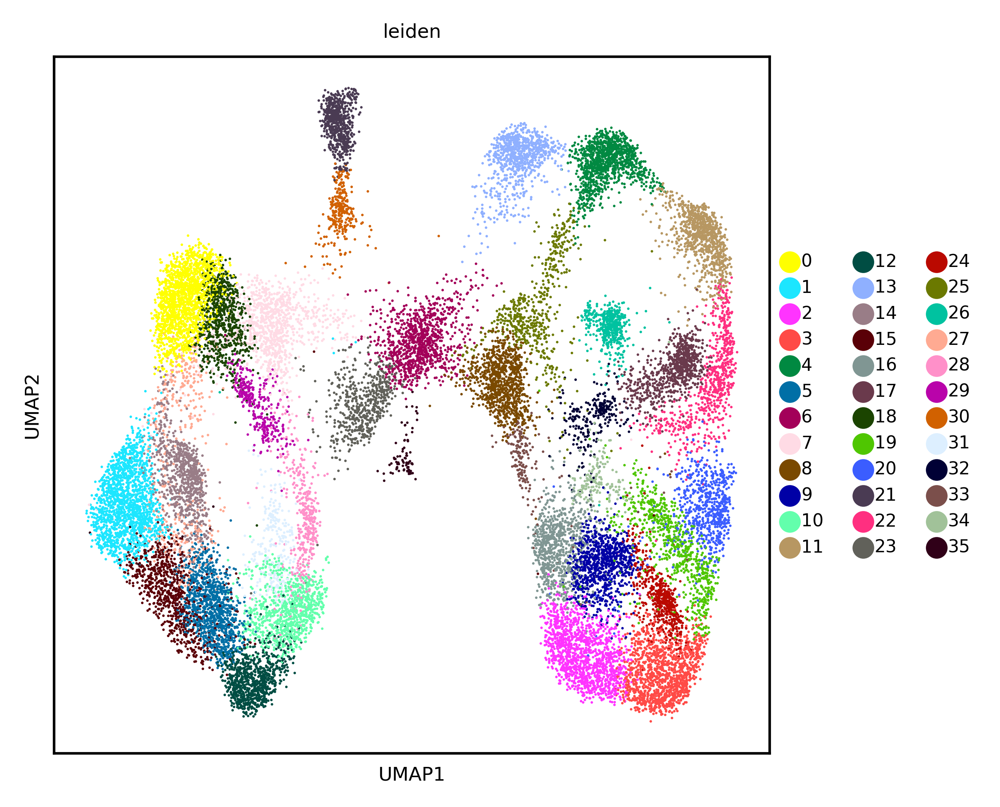

In [28]:
# settings for manuscript plots
feat = 'leiden'
sc.settings.set_figure_params( dpi=300, fontsize=6)
ax = sc.pl.umap( plt_adata, color=feat, size=2.5, sort_order=False, show=False)
# plt.savefig( f"{fig_path}GABA_UMAP-{feat}.png", format='png', dpi=300, bbox_inches='tight')

## **Gene Overlay Plots - with full count matrix**

In [29]:
# set umap and pca to adata
adata.obsm = high_adata.obsm
# set clustering to adata
adata.obs['leiden'] = high_adata.obs['leiden']
# normalize full count matrix for overlays
adata.X = adata.layers['raw-cts_pre-ds'].copy()
# re-calculate umi and gene counts per nuclei
sc.pp.calculate_qc_metrics( adata, percent_top=None, inplace=True)
# scale to CPM
sc.pp.normalize_total( adata, target_sum=1e6, inplace=True)
# VST
sc.pp.log1p( adata, copy=False)
# randomize order again
plt_adata = sc.pp.subsample( adata, fraction=1.0, random_state=0, copy=True) 

In [30]:
sc.settings.set_figure_params( dpi=150, fontsize=6)
def plot_save_overlays( genes, title, adata=plt_adata, pt_size=5):
    ax = sc.pl.umap( adata, color=genes, size=pt_size, sort_order=False, cmap='magma', show=False)
#     plt.savefig( f"{fig_path}GABA_UMAP-{title}.png", format='png', bbox_inches='tight')
    return

Inhibitory Neruon Markers

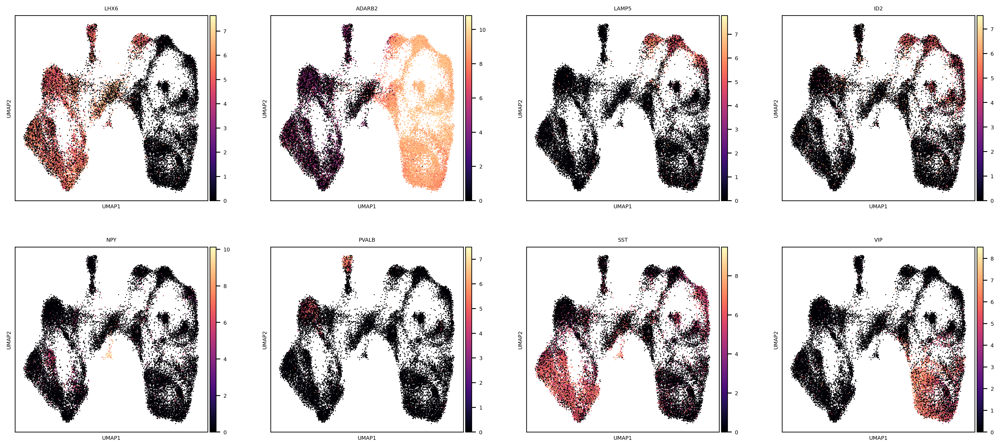

In [31]:
in_genes = ['LHX6','ADARB2','LAMP5','ID2','NPY','PVALB','SST','VIP']
plot_save_overlays( in_genes, 'IN_genes')

## **Read in manually annotated cluster data and label leiden clusters**

In [32]:
# read in cluster data
adata.uns['gaba_clust_data'] = pd.read_csv( "../data/GABA_Cluster-Identification.csv", index_col=['leiden'], dtype=str)
adata.uns['gaba_clust_data'].head()

,mat/dev,cell_type,major_clust,sub_clust,used for plotting,dev_clust,downstream_dev_clusts
leiden,,,,,,,
0,mat,MGE,PV,PV_WFDC2,PV_WFDC2,PV_WFDC2,"PV_dev,MGE_dev-1"
1,dev,MGE,SST,SST_CALB1_dev,SST_CALB1,SST_CALB1_dev,"MGE_dev-2,MGE_dev-1"
2,mat,CGE,VIP,VIP_HS3ST3A1,VIP_HS3ST3A1,VIP_HS3ST3A1,"VIP_dev,CGE_dev"
3,mat,CGE,VIP,VIP_CHRM2,VIP_CHRM2,VIP_CHRM2,"VIP_dev,CGE_dev"
4,mat,CGE,ID2,LAMP5_CCK,LAMP5_CCK,LAMP5_CCK,"ID2_dev,CGE_dev"


### Assign cluster data to nuclei


In [33]:
adata.obs.head()

,batch,RL#,age,chem,concat_id,numerical_age,stage_id,Sex,Race,PMI,...,percent_mito,percent_ribo,n_counts,leiden,mat/dev,cell_type,major_clust,sub_clust,dev_clust,downstream_dev_clusts
AAACCTGAGTCGAGTG-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.009107,0.007372,2186.0,1,IN,IN,IN,IN,IN,IN
AAACCTGGTACTCAAC-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.004300,0.010555,2423.0,16,IN,IN,IN,IN,IN,IN
AAACCTGGTCAAGCGA-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.002792,0.003299,3838.0,12,IN,IN,IN,IN,IN,IN
AAACCTGGTTATCACG-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.001701,0.005952,3318.0,15,IN,IN,IN,IN,IN,IN
AAACCTGTCACCGGGT-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.005242,0.007427,2174.0,1,IN,IN,IN,IN,IN,IN


In [34]:
# to merge on index have to change to str to match .obs['leiden'] dtype 
adata.uns['gaba_clust_data'].index = adata.uns['gaba_clust_data'].index.map(str)
# list clusters of interest
coi = ['mat/dev','cell_type','major_clust','sub_clust','dev_clust','downstream_dev_clusts']
# drop coi from whole tissue
adata.obs.drop( columns=coi, inplace=True)
# populate observations with cluster data
adata.obs = adata.obs.join( adata.uns['gaba_clust_data'][coi], on="leiden")
adata.obs.head()

,batch,RL#,age,chem,concat_id,numerical_age,stage_id,Sex,Race,PMI,...,percent_mito,percent_ribo,n_counts,leiden,mat/dev,cell_type,major_clust,sub_clust,dev_clust,downstream_dev_clusts
AAACCTGAGTCGAGTG-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.009107,0.007372,2186.0,1,dev,MGE,SST,SST_CALB1_dev,SST_CALB1_dev,"MGE_dev-2,MGE_dev-1"
AAACCTGGTACTCAAC-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.004300,0.010555,2423.0,16,mat,CGE,VIP,VIP_ABI3BP,VIP_ABI3BP,"VIP_dev,CGE_dev"
AAACCTGGTCAAGCGA-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.002792,0.003299,3838.0,12,mat,MGE,SST,SST_STK32A,SST_STK32A,"MGE_dev-2,MGE_dev-1"
AAACCTGGTTATCACG-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.001701,0.005952,3318.0,15,dev,MGE,SST,SST_ADGRG6_dev,SST_ADGRG6_dev,"MGE_dev-2,MGE_dev-1"
AAACCTGTCACCGGGT-RL1612_34d_v2,RL1612_34d_v2,RL1612,34d,v2,0,0.093151,Neonatal,M,AA,5,...,0.005242,0.007427,2174.0,1,dev,MGE,SST,SST_CALB1_dev,SST_CALB1_dev,"MGE_dev-2,MGE_dev-1"


... storing 'leiden' as categorical
... storing 'mat/dev' as categorical
... storing 'cell_type' as categorical
... storing 'major_clust' as categorical
... storing 'sub_clust' as categorical
... storing 'dev_clust' as categorical
... storing 'downstream_dev_clusts' as categorical


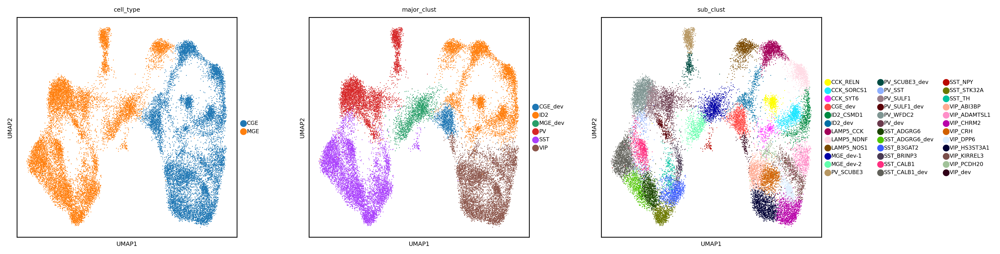

In [35]:
ax = sc.pl.umap( adata, color=['cell_type','major_clust','sub_clust'], size=2.5, sort_order=False, show=False)

In [36]:
adata.obs['leiden'] = 'IN' + adata.obs['leiden'].astype(str)
adata.write( "../data/post-gaba-clustering.h5ad")

... storing 'leiden' as categorical


### Add GABA clustering to whole-tissue anndata

In [37]:
adata.obs['leiden'] = adata.obs['leiden'].astype(str)
wt_adata.obs['combined-leiden'] = wt_adata.obs['leiden'].astype(str)
wt_adata.obs.loc[adata.obs.index,'combined-leiden'] = adata.obs['leiden']
wt_adata.uns['gaba_clust_data'] = adata.uns['gaba_clust_data']
for ii in ['dev_clust', 'sub_clust', 'major_clust']:
    wt_adata.obs[ii] = wt_adata.obs[ii].astype(str)
    wt_adata.obs.loc[adata.obs.index,ii] = adata.obs[ii]

... storing 'major_clust' as categorical
... storing 'sub_clust' as categorical
... storing 'dev_clust' as categorical
... storing 'combined-leiden' as categorical


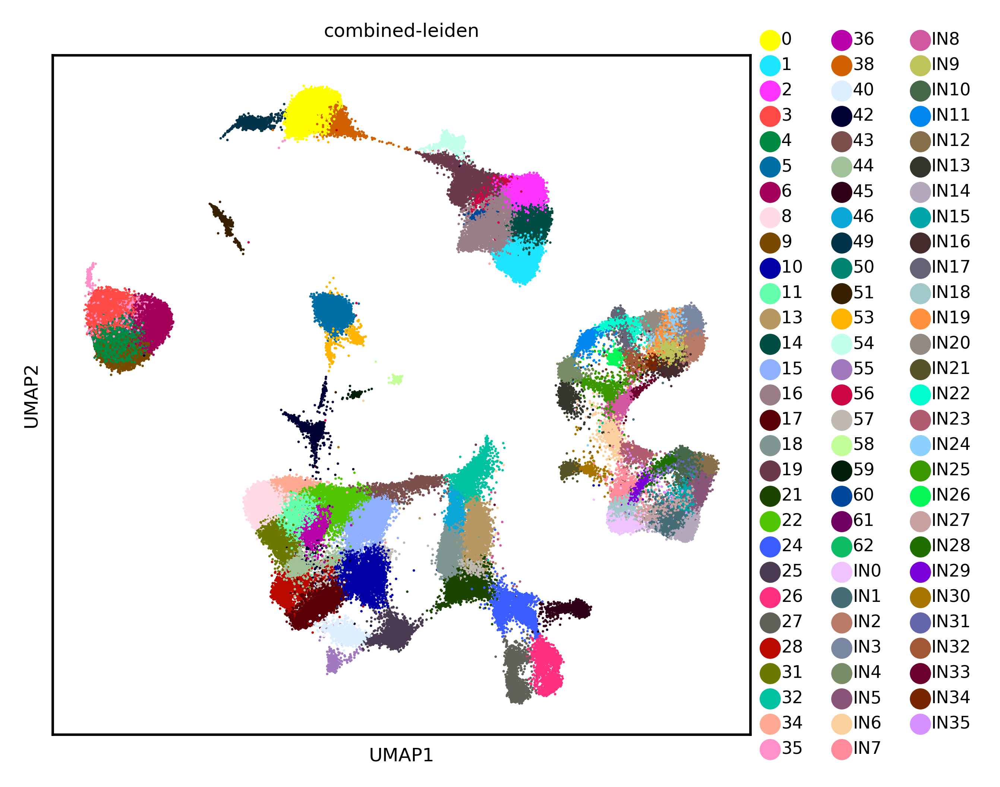

In [38]:
# settings for manuscript plots
feat = 'combined-leiden'
sc.settings.set_figure_params( dpi=300, fontsize=6)
ax = sc.pl.umap( wt_adata, color=feat, size=2.5, sort_order=False, show=False)
# plt.savefig( f"{fig_path}GABA_UMAP-{feat}.png", format='png', dpi=300, bbox_inches='tight')

In [39]:
wt_adata.write( "../data/post-gaba-wt-clustering.h5ad")